<b><font size="5">Predicting the Difficulty and Enjoyment Rating of Backpacking Trails</font></b>

Here, I build machine learning models to predict the difficulty and enjoyment rating of backpacking trails I am personally interested in hiking. The base dataset of ~3000 trails is an exhaustive list of all trails in USA National Parks, scraped from Alltrails.com. I include data from trails I've hiked myself as well. I add a feature to keep track of which trails are mine, helping fine-tune the model to my preferences. A historical weather API is used to get climate data for each trail.

<b>Summary of Steps:</b>
1. Get climate data for each trail location using HistoricalWeatherFinder.ipynb
1. Convert the elevation gain from AllTrails's GPS data to align with values from topographic data
1. Generate statics and visualizations
1. Generate difficulty/rating models and predictions
1. Visualize and compare prediction results

<b>Summary of Results:</b>
- Difficulty Model Score: ~0.70
- Rating Model Score: ~0.20

It turns out that a trail's length, elevation gain, climate, and physical features are enough to predict its difficulty with decent accuracy. Enjoyment is a different matter. Enjoyment is impacted greatly by season, weather, preparedness, and who you are hiking with, none of which is accounted for. It would be better to have a dataset of individual trail reviews with timestamps linked to users.

<b><font size="3">Imports and Defining Variables</font></b>

In [9]:
### Imports

import numpy as np
import pandas as pd
import seaborn as sns
import pickle
import requests
import calendar
from datetime import datetime, timedelta
import datetime as dt
import plotly.graph_objs as go
import plotly.express as px

from matplotlib import pyplot as plt, ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.dates import MonthLocator, YearLocator, DateFormatter
import matplotlib.patches as mpatches
import matplotlib.ticker as plticker
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.ticker import MultipleLocator, AutoMinorLocator

from sklearn.linear_model import Ridge, Lasso, RidgeCV
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [10]:
### Defining Variables

# colours
backgroundColor = '#292929'
distColor = 'darkorange'
legendColor = 'w'
diffColors = np.array(['limegreen', 'yellow', 'darkorange', 'red'])
gainColors = np.array(['tab:blue', 'w', 'tab:red'])
rainColors = np.array(['gold', 'w', 'royalblue'])

# font sizes
titleSize = 32
axisLabelSize = 26
tickLabelSize = 16
legendTextSize = 16

# misc
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
standardCanvasHeight = 8
standardCanvasWidth = 16
DPI = 300 # dots per inch of plots 
myTrailsCSV = 'dataSources/MyTrails.csv'
X_columns = ['park', 'region', 'province', 'country', 'distance', 'elevation_gain', 'route_type', 'num_reviews', 
             'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow', 'forest', 'lake', 'river', 'waterfall', 'beach', 
             'historic_site', 'cave', 'hot_spring', 'backpacking', 'Jamie']

<b><font size="3">Data Set Up</font></b>

In [11]:
### Setting Up Dataframes

"""
gps-topographic elevation gain conversion
Refer to ElevationGainConversionFinder.ipynb for more info
"""
def gps2Topo(gain, dist):
    slope = gain/dist
    if slope < 50:
        gain = gain*(slope/50)
    return gain

"""
Determines if I have already hiked in a particular a park, province, or country
"""
def convertNew(x, feature):
    if x in myTrails[myTrails.status == 0][feature].unique():
        return x
    else:
        return f'New {feature}'
    
def convertNewRegionsInMyTrails():
    myTrails['park'] = myTrails.park.apply(convertNew, feature='park') # unhiked parks get labelled as "New park"
    myTrails['region'] = myTrails.region.apply(convertNew, feature='region') # etc...
    myTrails['province'] = myTrails.province.apply(convertNew, feature='province')
    myTrails['country'] = myTrails.country.apply(convertNew, feature='country')

# importing my trails
myTrails = pd.read_csv(myTrailsCSV, parse_dates=['start_date', 'end_date'], engine='python')

# adding/modifying columns
myTrails['backpacking'] = 1 # I only keep track of backpacking trails
myTrails['Jamie'] = 1
myTrails['num_reviews'] = 1
myTrails['month'] = myTrails.end_date.dt.month
myTrails['nights'] = (myTrails.end_date - myTrails.start_date).dt.days
myTrails['days'] = myTrails.nights + 1
myTrails['park_init'] = myTrails.park.copy() # park_init will hold original park labels for my trails
myTrails['region_init'] = myTrails.region.copy()
myTrails['province_init'] = myTrails.province.copy()
myTrails['country_init'] = myTrails.country.copy()
myTrails['avg_temp'] = (myTrails.min_temp + myTrails.max_temp)/2
myTrails['dist_per_day'] = myTrails.distance.divide(myTrails.days)
myTrails['gain_per_day'] = myTrails.elevation_gain.divide(myTrails.days)
myTrails['rain_per_night'] = myTrails.rain.divide(myTrails.nights)
myTrails['snow_per_night'] = myTrails.snow.divide(myTrails.nights)
convertNewRegionsInMyTrails()

myCompletedTrails = myTrails.query('status == 0').copy() # trails I have completed
myWatchedTrails = myTrails.query('status == 1').copy() # trails on my watchlist

# adding a column for each name in people_names
peopleNames = myCompletedTrails.people_names.str.split(', ').explode().dropna().unique()
for person in peopleNames:
    myCompletedTrails[person] = myCompletedTrails.people_names.str.contains(person).astype('int')

# importing USA National Park data
usaTrails = pd.read_csv('dataSources/AllTrailsUsaNationalParks.csv', engine='python')

# adding/modifying columns
usaTrails['lat'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[1][:-7], axis=1)
usaTrails['lng'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[2][:-1], axis=1)
usaTrails['forest'] = usaTrails.features.str.contains('forest')
usaTrails['lake'] = usaTrails.features.str.contains('lake')
usaTrails['river'] = usaTrails.features.str.contains('river')
usaTrails['waterfall'] = usaTrails.features.str.contains('waterfall')
usaTrails['beach'] = usaTrails.features.str.contains('beach')
usaTrails['historic_site'] = usaTrails.features.str.contains('historic_site')
usaTrails['cave'] = usaTrails.features.str.contains('cave')
usaTrails['hot_spring'] = usaTrails.features.str.contains('hot_spring')
usaTrails['backpacking'] = usaTrails.activities.str.contains('backpacking')
usaTrails['country_name'] = 'USA'
usaTrails.loc[usaTrails['state_name'] == "Maui", 'state_name'] = "Hawaii" # Maui is part of Hawaii
usaTrails['length'] = usaTrails['length']/1000 # m to km
usaTrails['Jamie'] = 0
usaTrails['area_name'] = usaTrails['area_name'].str.replace(' National Park', '') # trimming park names
usaTrails['park_init'] = usaTrails.area_name.copy() # park_init will hold original park labels for my trails
usaTrails['region_init'] = usaTrails.city_name.copy()
usaTrails['province_init'] = usaTrails.state_name.copy()
usaTrails['country_init'] = usaTrails.country_name.copy()

# filtering
noDriving = ~usaTrails.activities.str.contains('driving')
noPaddle = ~usaTrails.name.str.contains('Paddle')
usaTrails = usaTrails.query('@noDriving and @noPaddle and length > 0.1 and num_reviews > 0')

# gps-topographic elevation gain conversion
usaTrails['elevation_gain'] = usaTrails.apply(lambda trail: gps2Topo(trail.elevation_gain, trail.length), axis=1)
usaTrails = usaTrails.query('elevation_gain > 1')

# removing unneeded columns
usaTrails = usaTrails.drop(['trail_id','popularity','visitor_usage','units',
                            '_geoloc','features','activities'],axis=1)

# renaming columns
usaTrails = usaTrails.rename(columns={'length': 'distance',
                                      'difficulty_rating':'difficulty',
                                      'avg_rating':'rating',
                                      'area_name':'park',
                                      'city_name':'region',
                                      'state_name':'province',
                                      'country_name':'country'})

ourTrails = pd.concat([usaTrails, myCompletedTrails])
allOurTrails = pd.concat([usaTrails, myTrails])

# catagorical column encoding
one_hot = OneHotEncoder(categories=[allOurTrails.route_type.unique(),
                                    allOurTrails.park.unique(),
                                    allOurTrails.region.unique(),
                                    allOurTrails.province.unique(),
                                    allOurTrails.country.unique()])
transformer = ColumnTransformer([('one_hot', one_hot, ['route_type','park','region','province','country'])],
                                remainder='passthrough')

<b><font size="3">Statistics</font></b>

In [12]:
### Statistics

"""
determines if there is a tie for a trail record
constructs string for printing
"""
def tieValidator(rec, fullLocation=True):
    recordValues = rec.name.values
    if len(recordValues) == 1:
        if fullLocation == False:
            return recordValues[0]
        else:
            return f"{rec.name.values[0]}, {rec.park.values[0]}, {rec.province.values[0]}, {rec.country.values[0]}"
    else:
        return f"{len(recordValues)} way tie" 


"""
determines the min/max of a trail feature
findMax=True -> find the max, findMax=False -> find the min
perColumn=True -> determines the min/max PER (perColumn)
"""
def printTrailRecord(trails, recordName, column, units, findMax=True, perColumn=None, perColumnUnits=None):
    if perColumn == None:
        if findMax == True:
            recordCondition = trails[column] == trails[column].max()
        else:
            recordCondition = trails[column] == trails[column].min()
        recordTrails = trails.query('@recordCondition')
        return print(f"{recordName}: {round(recordTrails[column].values[0], 1)} {units} " 
                     + f"({tieValidator(recordTrails)})")
    else:
        if findMax == True:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).max()
        else:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).min()
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0]/(recordTrails[perColumn].values[0]))}'
                     + f' {units}/{perColumnUnits} ({tieValidator(recordTrails)})')

print("MY COMPLETED TRAIL STATISTICS")
print('\n')

print("TOTALS")
totalDist = myCompletedTrails.distance.sum()
print(f"Distance: {round(totalDist, 0)} km ({round(totalDist/40075, 3)} Earth circumnavigations, " 
      + f"{round(totalDist/42.195, 1)} marathons, {round(totalDist/0.4)} running track laps)")
totalGain = myCompletedTrails.elevation_gain.sum()
print(f"Elevation Gain: {totalGain} m ({round(totalGain/(3480.816), 1)} Everests, {round(totalGain/346, 1)} "
      + f"CN Towers, {round(totalGain/1.8415)} Jamies)")
numCompletedTrails = len(myCompletedTrails)
print(f"Number of Trails: {numCompletedTrails}")
print(f"Number of Days: {round(myCompletedTrails.days.sum())}")
print(f"Number of Nights: {round(myCompletedTrails.nights.sum())}")
totalRain = myCompletedTrails.rain.sum()
print(f"Rain: {round(totalRain)} mm ({round(totalRain/123, 1)} cans of pop)")
totalSnow = myCompletedTrails.snow.sum()
print(f"Snow: {round(totalSnow)} cm ({round(totalSnow/12.3, 2)} cans of pop)")
print('\n')

print("RECORDS")
printTrailRecord(myCompletedTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(myCompletedTrails, 'Most Distance per Day', 'distance', 'km', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Elevation Gain per Day', 'elevation_gain', 'm', 
                 perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedTrails, 'Most Nights', 'nights', 'nights')
printTrailRecord(myCompletedTrails, 'Hottest Temperature', 'max_temp', '°C')
printTrailRecord(myCompletedTrails, 'Coldest Temperature', 'min_temp', '°C', findMax=False)
printTrailRecord(myCompletedTrails, 'Most Rain', 'rain', 'mm')
printTrailRecord(myCompletedTrails, 'Most Snow', 'snow', 'cm')
print(f"Most Common Park: {myCompletedTrails.park.mode().iloc[0]} " 
      + f"({round(myCompletedTrails.park.value_counts()[0]/numCompletedTrails, 2)} of trails)")
print('\n')

print("RATES")
print(f"Solo Rate: {round(len(myCompletedTrails[myCompletedTrails.people == 1])/numCompletedTrails, 2)}")
print(f"Forest Rate: {round(myCompletedTrails.forest.mean(), 2)}")
print(f"Lake Rate: {round(myCompletedTrails.lake.mean(), 2)}")
print(f"River Rate: {round(myCompletedTrails.river.mean(), 2)}")
print(f"Waterfall Rate: {round(myCompletedTrails.waterfall.mean(), 2)}")
print(f"Beach Rate: {round(myCompletedTrails.beach.mean(), 2)}")
print(f"Historic Site Rate: {round(myCompletedTrails.historic_site.mean(), 2)}")
print(f"Cave Rate: {round(myCompletedTrails.cave.mean(), 2)}")
print(f"Hot Spring Rate: {round(myCompletedTrails.hot_spring.mean(), 2)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(myCompletedTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(myCompletedTrails.elevation_gain.mean())} m")
print(f"Average Number of Days: {round(myCompletedTrails.days.mean(), 1)} days")
print('\n')

print("AVERAGES (BY DAY)")
mySoloTrails = myCompletedTrails.query('people == 1')
myGroupTrails = myCompletedTrails.query('people > 1')
avgCompletedDistance = myCompletedTrails.distance.sum()/myCompletedTrails.days.sum()
print(f"Average Distance: {round(avgCompletedDistance, 1)} km " 
      + f"(Solo: {round(mySoloTrails.distance.sum()/mySoloTrails.days.sum(), 1)} km, " 
      + f"Group: {round(myGroupTrails.distance.sum()/myGroupTrails.days.sum(), 1)} km)")
avgCompletedGain = myCompletedTrails.elevation_gain.sum()/myCompletedTrails.days.sum()
print(f"Average Elevation Gain: {round(avgCompletedGain)} m " 
      + f"(Solo: {round(mySoloTrails.elevation_gain.sum()/mySoloTrails.days.sum())} m, " 
      + f"Group: {round(myGroupTrails.elevation_gain.sum()/myGroupTrails.days.sum())} m)")
print('\n')

print("------------------------------------------------------------")
print('\n')

print("FULL DATASET STATISTICS")
print('\n')

print("TOTALS")
numTrails = len(ourTrails)
print(f"Number of Trails: {numTrails}")
print('\n')

print("RECORDS")
printTrailRecord(ourTrails, 'Longest Trail', 'distance', 'km')
printTrailRecord(ourTrails, 'Steepest Trail', 'elevation_gain', 'm', perColumn='distance', perColumnUnits='km')
printTrailRecord(ourTrails, 'Hottest Trail', 'summer_temp', '°C')
printTrailRecord(ourTrails, 'Coldest Trail', 'winter_temp', '°C', findMax=False)
printTrailRecord(ourTrails, 'Wettest Trail', 'annual_rain', 'mm/year')
printTrailRecord(ourTrails, 'Driest Trail', 'annual_rain', 'mm/year', findMax=False)
printTrailRecord(ourTrails, 'Trendiest Trail', 'num_reviews', 'reviews')
stateWithMostTrails = ourTrails.province.mode()[0]
print(f"State with Most Trails: {stateWithMostTrails} "
      + f"({round(len(ourTrails[ourTrails.province == stateWithMostTrails])/numTrails, 3)} of trails)")
print('\n')

print("RATES")
print(f"Backpacking Trail Rate: {round(ourTrails.backpacking.mean(), 2)}")
print(f"Jamie Trail Rate: {round(ourTrails.Jamie.mean(), 3)}")
print('\n')

print("AVERAGES (BY TRAIL)")
print(f"Average Distance: {round(ourTrails.distance.mean(), 1)} km")
print(f"Average Elevation Gain: {round(ourTrails.elevation_gain.mean())} m")

MY COMPLETED TRAIL STATISTICS


TOTALS
Distance: 685.0 km (0.017 Earth circumnavigations, 16.2 marathons, 1713 running track laps)
Elevation Gain: 12880 m (3.7 Everests, 37.2 CN Towers, 6994 Jamies)
Number of Trails: 25
Number of Days: 65
Number of Nights: 40
Rain: 125 mm (1.0 cans of pop)
Snow: 3 cm (0.23 cans of pop)


RECORDS
Most Distance: 77.6 km (La Cloche, Killarney, Ontario, Canada)
Most Elevation Gain: 1780 m (Kepler Track, Fiordland, South Island, New Zealand)
Most Distance per Day: 18 km/day (Kepler Track, Fiordland, South Island, New Zealand)
Most Elevation Gain per Day: 755 m/day (Grand Canyon, Grand Canyon, Arizona, USA)
Most Nights: 4.0 nights (La Cloche, Killarney, Ontario, Canada)
Hottest Temperature: 27.4 °C (Witchy Waterslide, Algonquin, Ontario, Canada)
Coldest Temperature: -14.6 °C (Mizzy Lake, Algonquin, Ontario, Canada)
Most Rain: 27.9 mm (Grand Canyon, Grand Canyon, Arizona, USA)
Most Snow: 1.7 cm (Minnesing, Algonquin, Ontario, Canada)
Most Common Park: Algonqu

In [13]:
### Summarizing stats by person (for my hiking companions)

hikingCompanions = pd.DataFrame(columns=['name', 'num_trails', 'num_parks', 'num_days', 'num_nights', 
                                         'distance', 'elevation_gain', 'longest_hike', 'longest_hike_dist', 
                                         'max_temp', 'min_temp', 'avg_temp', 'rain', 'snow', 'rating_corr'])

"""
Populating new hikingCompanions dataframe
One row for each person that has joined me on a backpacking trip
"""
for i, person in enumerate(peopleNames):
    if person != 'Jamie':
        personTrailCondition = myCompletedTrails[person] == 1
        personTrails = myCompletedTrails.query('@personTrailCondition')
        longestTrails = personTrails.query('distance == @personTrails.distance.max()')
        hikingCompanions.loc[i] = ([person, # name
                                    len(personTrails), # num_trails
                                    len(personTrails.park.unique()), # num_parks
                                    round(personTrails.days.sum()), # num_days
                                    round(personTrails.nights.sum()), # num_nights
                                    round(personTrails.distance.sum(), 1), # distance
                                    round(personTrails.elevation_gain.sum(), 1), # elevation_gain
                                    longestTrails.name.values[0], # longest_hike
                                    longestTrails.distance.values[0], # longest_hike_dist
                                    personTrails.max_temp.max(), # max_temp
                                    personTrails.min_temp.min(), # min_temp
                                    (personTrails.max_temp.max() + personTrails.max_temp.min())/2, # avg_temp
                                    personTrails.rain.sum(), # rain
                                    personTrails.snow.sum(), # snow
                                    myCompletedTrails[person].corr(myCompletedTrails.rating)]) # rating_corr

hikingCompanions['dist_per_day'] = hikingCompanions.distance/hikingCompanions.num_days.astype(float).round()
hikingCompanions['gain_per_day'] = (hikingCompanions.elevation_gain/hikingCompanions.num_days).astype(float).round()
hikingCompanions['rain_per_night'] = hikingCompanions.rain/hikingCompanions.num_nights.astype(float).round()
hikingCompanions['snow_per_night'] = hikingCompanions.snow/hikingCompanions.num_nights.astype(float).round()
hikingCompanions = round(hikingCompanions, 2)
numHikingCompanions = len(hikingCompanions)

def printPersonStat(prefix, units, recordFeature, person, personStats, rankMethod='min', rankAsc=False):    
    hikingCompanionsCopy = hikingCompanions.copy()
    hikingCompanionsCopy['recordRank'] = (hikingCompanionsCopy[recordFeature]
                                          .rank(method=rankMethod, ascending=rankAsc)
                                          .astype(int))
    personRank = hikingCompanionsCopy.query('name == @person').recordRank.values[0]
    numPeopleWithRank = hikingCompanionsCopy.recordRank.value_counts()[personRank]
    
    tieMsg = ''
    if numPeopleWithRank > 1:
        tieMsg = f' [{numPeopleWithRank} way tie]'
        
    if units != '':
        units = ' ' + units
        
    print(f'{prefix}: {personStats[recordFeature].values[0]}{units} (Rank: {personRank}/{numHikingCompanions}{tieMsg})')

def personBackpackingSummary(person):
    print(f"{person}'s backpacking summary".upper())
    print(f"with comparisons to Jamie's other hiking companions (there are {numHikingCompanions})")
    print('\n')
    
    personStats = hikingCompanions.query('name == @person')

    printPersonStat('Number of Trails', '', 'num_trails', person, personStats)
    printPersonStat('Number of Days', '', 'num_days', person, personStats)
    printPersonStat('Number of Nights', '', 'num_nights', person, personStats)
    printPersonStat("Correlation with Jamie's Enjoyment", '', 'rating_corr', person, personStats)
    print('\n')
    
    printPersonStat('Total Distance', 'km', 'distance', person, personStats)
    printPersonStat('Total Elevation Gain', 'm', 'elevation_gain', person, personStats)
    printPersonStat('Distance per Day', 'km/day', 'dist_per_day', person, personStats)
    printPersonStat('Elevation Gain per Day', 'm/day', 'gain_per_day', person, personStats)
    print(f'Longest Trail: {personStats.longest_hike.values[0]} ({personStats.longest_hike_dist.values[0]} km)')
    print('\n')

    printPersonStat('Hottest Tempurature', '°C', 'max_temp', person, personStats)
    printPersonStat('Coldest Tempurature', '°C', 'min_temp', person, personStats, rankAsc=True)
    printPersonStat('Total Rain', 'mm', 'rain', person, personStats)
    printPersonStat('Rain per 24h', 'mm/24h', 'rain_per_night', person, personStats)
    if personStats['min_temp'].values[0] <= 0:
        printPersonStat('Total Snow', 'cm', 'snow', person, personStats)
        printPersonStat('Snow per 24h', 'cm/24h', 'snow_per_night', person, personStats)
    
personBackpackingSummary('Paige')

PAIGE'S BACKPACKING SUMMARY
with comparisons to Jamie's other hiking companions (there are 12)


Number of Trails: 2 (Rank: 2/12 [5 way tie])
Number of Days: 5 (Rank: 4/12 [3 way tie])
Number of Nights: 3 (Rank: 4/12 [4 way tie])
Correlation with Jamie's Enjoyment: 0.15 (Rank: 2/12 [2 way tie])


Total Distance: 47.6 km (Rank: 3/12 [2 way tie])
Total Elevation Gain: 1760 m (Rank: 1/12 [2 way tie])
Distance per Day: 9.52 km/day (Rank: 3/12 [2 way tie])
Elevation Gain per Day: 352.0 m/day (Rank: 2/12 [2 way tie])
Longest Trail: Mount Marcy (36.2 km)


Hottest Tempurature: 21.6 °C (Rank: 6/12 [2 way tie])
Coldest Tempurature: -14.6 °C (Rank: 1/12 [3 way tie])
Total Rain: 0.0 mm (Rank: 8/12 [5 way tie])
Rain per 24h: 0.0 mm/24h (Rank: 8/12 [5 way tie])
Total Snow: 1.0 cm (Rank: 1/12 [3 way tie])
Snow per 24h: 0.33 cm/24h (Rank: 1/12 [3 way tie])


In [14]:
### Summarizing stats by trail

def printTrailStat(prefix, units, recordFeature, trailNumber, trailStats, rankMethod='min', rankAsc=False):
    myCompletedTrailsCopy = myCompletedTrails.copy()
    myCompletedTrailsCopy['recordRank'] = (myCompletedTrailsCopy[recordFeature]
                                .rank(method=rankMethod, ascending=rankAsc)
                                .astype(int))
    trailRank = myCompletedTrailsCopy.query('id == @trailNumber').recordRank.values[0]
    numTrailsWithRank = myCompletedTrailsCopy.recordRank.value_counts()[trailRank]
    
    tieMsg = ''
    if numTrailsWithRank > 1:
        tieMsg = f' [{numTrailsWithRank} way tie]'
        
    print(f'{prefix}: {round(trailStats[recordFeature].values[0], 1)} {units} (Rank: {trailRank}/{numCompletedTrails}{tieMsg})')
    
def completedTrailSummary(idNum):
    print(f'TRAIL #{idNum} SUMMARY')
    print(f"with comparisons to Jamie's other completed trails (there are {numCompletedTrails})")
    print('\n')
    
    trail = myCompletedTrails.query('id == @idNum')
    print(f'Name: {trail.name.values[0]}')
    print(f'Park: {trail.park.values[0]}')
    print(f'Region: {trail.region.values[0]}')
    print(f'Province: {trail.province.values[0]}')
    print(f'Country: {trail.country.values[0]}')
    print('\n')
    
    print(f'People: {trail.people_names.values[0]}')
    print(f'Difficulty: {round(trail.difficulty.values[0])}/7')
    print(f'Enjoyment: {round(trail.rating.values[0])}/5')
    print('\n')
    
    printTrailStat('Distance', 'km', 'distance', idNum, trail)
    printTrailStat('Distance per Day', 'km/day', 'dist_per_day', idNum, trail)
    printTrailStat('Elevation Gain', 'm', 'elevation_gain', idNum, trail)
    printTrailStat('Elevation Gain per Day', 'm/day', 'gain_per_day', idNum, trail)
    print('\n')
    
    printTrailStat('Hottest Tempurature', '°C', 'max_temp', idNum, trail)
    printTrailStat('Coldest Tempurature', '°C', 'min_temp', idNum, trail, rankAsc=True)
    printTrailStat('Total Rain', 'mm', 'rain', idNum, trail)
    printTrailStat('Rain per 24h', 'mm', 'rain_per_night', idNum, trail)
    if trail.min_temp.values[0] <= 0:
        printTrailStat('Total Snow', 'cm', 'snow', idNum, trail)
        printTrailStat('Snow per 24h', 'cm', 'snow_per_night', idNum, trail)

completedTrailSummary(25)

TRAIL #25 SUMMARY
with comparisons to Jamie's other completed trails (there are 25)


Name: Algonquin Pinnacle
Park: Algonquin
Region: Muskoka
Province: Ontario
Country: Canada


People: Jamie
Difficulty: 5/7
Enjoyment: 2/5


Distance: 20.0 km (Rank: 16/25)
Distance per Day: 10.0 km/day (Rank: 13/25)
Elevation Gain: 500 m (Rank: 8/25)
Elevation Gain per Day: 250.0 m/day (Rank: 7/25)


Hottest Tempurature: 0.1 °C (Rank: 24/25)
Coldest Tempurature: -7.7 °C (Rank: 3/25)
Total Rain: 0.0 mm (Rank: 17/25 [9 way tie])
Rain per 24h: 0.0 mm (Rank: 17/25 [9 way tie])
Total Snow: 0.1 cm (Rank: 3/25)
Snow per 24h: 0.1 cm (Rank: 3/25)


<b><font size="3">Data Visulaizations</font></b>

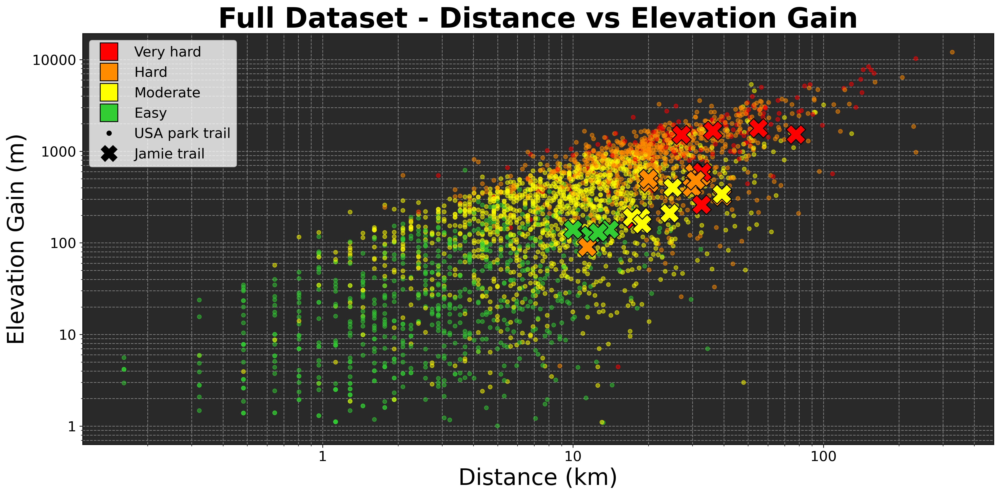

In [17]:
### Full Dataset - Distance vs Elevation Gain (with Difficulty, and Rating)

# converts difficulty to its corresponding index in diffColors
def difficultyColourIndex(trailDifficulty):
    return int((trailDifficulty - 1)/2)

usaDist = usaTrails.distance
# usaGain = usaTrails.elevation_gain
usaGain = usaTrails.elevation_gain
usaDifficulty = usaTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

myDist = myCompletedTrails.distance
myGain = myCompletedTrails.elevation_gain
myDifficulty = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

# plotting
fig = plt.gcf()
ax = plt.gca()
title = "Full Dataset - Distance vs Elevation Gain"
ax.set_title(title, size=titleSize, fontweight='bold')
legend_elements = [
    Line2D([0], [0], marker='s', color='none', label="Very hard", markerfacecolor=diffColors[3], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Hard", markerfacecolor=diffColors[2], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Moderate", markerfacecolor=diffColors[1], markersize=20),
    Line2D([0], [0], marker='s', color='none', label="Easy", markerfacecolor=diffColors[0], markersize=20),
    Line2D([0], [0], marker='.', color='none', label="USA park trail", markerfacecolor='k', markersize=10),
    Line2D([0], [0], marker='X', color='none', label="Jamie trail", markerfacecolor='k', markersize=18)]
ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})
plt.scatter(usaDist, usaGain, s=20, c=diffColors[usaDifficulty], marker='o', alpha=0.5, zorder=2)
plt.scatter(myDist, myGain, s=500, c=diffColors[myDifficulty], marker='X', edgecolors='k', zorder=3)
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.rcParams['axes.facecolor'] = backgroundColor
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel("Distance (km)", size=axisLabelSize)
plt.ylabel("Elevation Gain (m)", size=axisLabelSize)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=0)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
fig.set_dpi(DPI)
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

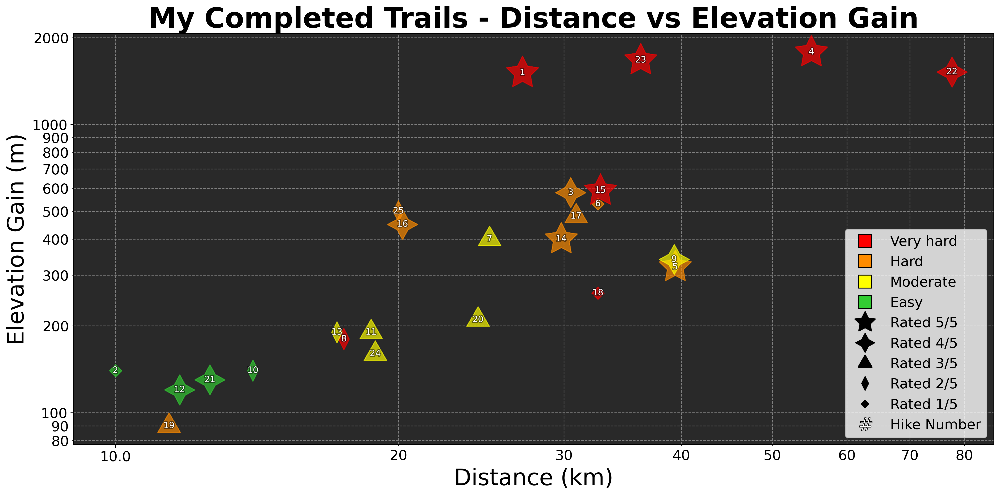

In [18]:
### My Completed Trails - Distance vs Elevation Gain (with Difficulty, and Rating)

import matplotlib.patheffects as path_effects

# generates a plot of Distance vs Elevation Gain (with Difficulty, and Rating)
def distGainPlot(title, 
                 xLabel, 
                 ylabel, 
                 dist, 
                 gain, 
                 rating, 
                 difficulty, 
                 annotations,
                 xLog=True, 
                 savePlot=False):
    
    fig = plt.gcf()
    ax = plt.gca()
    ax.set_title(title, size=titleSize, fontweight="bold")
    
    markers = ['D', (2,1,0), (3,1,0), (4,1,0), (5,1,0)]
    markerSizes = [100, 600, 900, 1200, 1500] 
    
    legend_elements = [
        Line2D([0], [0], marker='s', c='none', label="Very hard", markerfacecolor=diffColors[3], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Hard", markerfacecolor=diffColors[2], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Moderate", markerfacecolor=diffColors[1], markersize=15),
        Line2D([0], [0], marker='s', c='none', label="Easy", markerfacecolor=diffColors[0], markersize=15),
        Line2D([0], [0], marker=markers[4], c='none', label="Rated 5/5", markerfacecolor='k', markersize=25),
        Line2D([0], [0], marker=markers[3], c='none', label="Rated 4/5", markerfacecolor='k', markersize=22),
        Line2D([0], [0], marker=markers[2], c='none', label="Rated 3/5", markerfacecolor='k', markersize=19),
        Line2D([0], [0], marker=markers[1], c='none', label="Rated 2/5", markerfacecolor='k', markersize=16),
        Line2D([0], [0], marker=markers[0], c='none', label="Rated 1/5", markerfacecolor='k', markersize=6),
        Line2D([0], [0], marker='$\#$', c='none', label="Hike Number", markerfacecolor='w', markersize=16, mew=0.67)
    ]
    ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize}, loc=4)
   
    shadow_effect = [path_effects.withStroke(linewidth=2, foreground='black', alpha=0.5)]
    for _x, _y, _r, _c, _a in zip(dist, gain, rating, diffColors[difficulty], annotations):
        ratingIndex = int(_r-1)
        plt.scatter(_x, _y, s=markerSizes[ratingIndex], c=_c, marker=markers[ratingIndex], alpha=0.67, zorder=2)
        annotation = ax.annotate(round(_a), (_x, _y), c='w', size=10, ha='center', va='center')
        annotation.set_path_effects(shadow_effect)
        
    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)
    ax.set_yscale('log')
    if xLog == True:
        ax.set_xscale('log')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(ylabel, size=axisLabelSize)
    plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    ax.xaxis.set_minor_formatter(mticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
    ax.yaxis.set_minor_formatter(mticker.FormatStrFormatter('%.0f'))
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{title.replace(" ", "")}')
    plt.show()

# generating Distance vs Elevation Gain plot for my completed trails
distCompleted = myCompletedTrails.distance
gainCompleted = myCompletedTrails.elevation_gain
ratingCompleted = myCompletedTrails.rating
diffCompleted = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1)
hikeNumberCompleted = myCompletedTrails.id

distGainPlot('My Completed Trails - Distance vs Elevation Gain', 
             'Distance (km)',
             'Elevation Gain (m)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             savePlot = True)

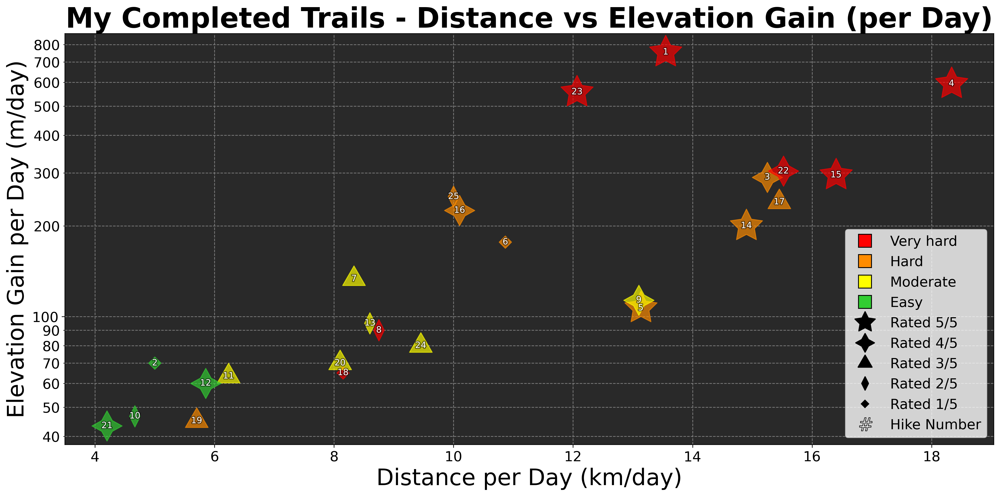

In [19]:
### My Completed Trails - Distance vs Elevation Gain (with Difficulty, and Rating)

distCompleted = myCompletedTrails.distance.divide(myCompletedTrails.days)
gainCompleted = myCompletedTrails.elevation_gain.divide(myCompletedTrails.days)

distGainPlot('My Completed Trails - Distance vs Elevation Gain (per Day)', 
             'Distance per Day (km/day)',
             'Elevation Gain per Day (m/day)',
             distCompleted, 
             gainCompleted, 
             ratingCompleted, 
             diffCompleted,
             hikeNumberCompleted,
             xLog = False,
             savePlot = True)

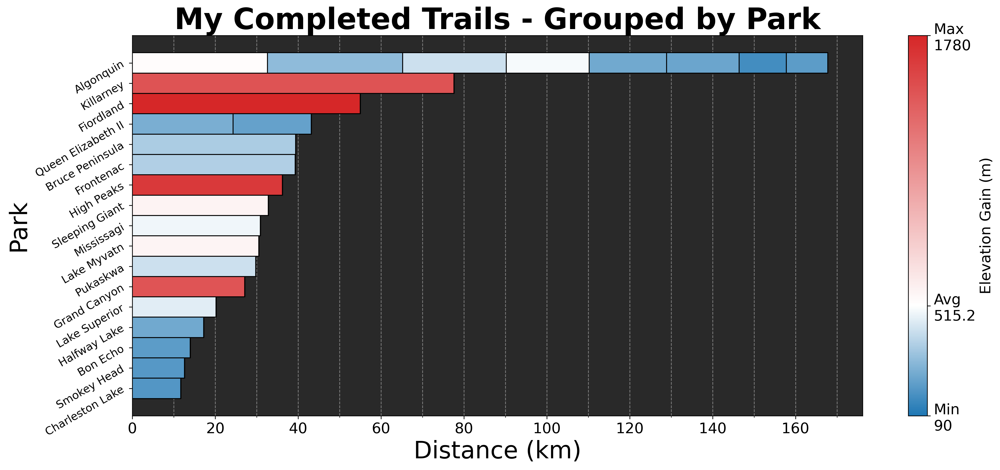

In [20]:
### Making stacked bar charts

def addTrailToBarStack(trail, barFeature, colorFeature, groups, groupBy, barValues, barColors):
    barStackIndex = groups.tolist().index(trail[groupBy])
    barStack = barValues[:, barStackIndex]
    
    # fill the first empty slot
    for j, barValue in enumerate(barStack):
        if barValue == 0:
            barValues[j, barStackIndex] = trail[barFeature]
            barColors[j, barStackIndex] = trail[colorFeature]
            break

def setUnitSpace(hasSpace):
    if hasSpace == True:
        return " "
    else:
        return ""

"""
Produces an decendeing coloured bar chart, grouped by a specified feature (groupBy).
Bar height is determined by an inputed feature (barFeature).
Bar colour is determined by another inputed feature (colorFeature).
"""
def stackedBarPlot(plotTitle, 
                   xLabel,
                   trails,
                   barFeature,
                   colorRange = gainColors,
                   colorFeature = None, # defaults to barFeature in function
                   colorLabel = '',
                   groupBy = 'park',
                   barThickness = 0.4,
                   savePlot = False):
    
    if colorFeature == None:
        colorFeature = barFeature 

    groups = trails[[groupBy, barFeature]].groupby(groupBy).sum().sort_values(barFeature, ascending=True)
    groups = groups.reset_index()[groupBy]
    
    numBarsStacked = trails[groupBy].value_counts()[0]
    barValues = np.zeros((numBarsStacked, len(groups)))
    barColors = np.zeros((numBarsStacked, len(groups)))

    sortedTrails = trails[[groupBy, barFeature, colorFeature]].sort_values([groupBy, barFeature], 
                                                                           ascending=[True, False])
    
    sortedTrails.apply(lambda trail: addTrailToBarStack(trail, barFeature, colorFeature, 
                                                        groups, groupBy, barValues, barColors), axis=1)
            
    # setting up bar colors
    cRangeMax = sortedTrails[colorFeature].max()
    cRangeMin = sortedTrails[colorFeature].min()
    cAvg = sortedTrails[colorFeature].mean()
    colorList = [(0.0, colorRange[0]), 
                 (cAvg/cRangeMax, colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list("", colorList)
    barColors /= cRangeMax # normalizing

    fig = plt.gcf()
    ax = plt.gca()

    for i in range(barValues.shape[0]):
        ax.barh(groups, 
                barValues[i], 
                left = np.sum(barValues[:i], axis = 0), 
                color=cmap(barColors[i]),
                edgecolor='k',
                height=1,
                zorder=2)
    
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(groups))))
    ax.set_yticklabels(groups, rotation = 30, ha="right")
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    ax.tick_params(axis='y', which='both', labelsize=12)
    ax.set_title(plotTitle, size=titleSize, fontweight='bold')

    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    
    plt.grid(axis="x", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="y", which="both", ls='none')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(groupBy.capitalize(), size=axisLabelSize)
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(groups)*barThickness)
    fig.set_dpi(DPI)
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    
    # setting colorbar
    sm = ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()

# My Completed Trails - Grouped by Park
stackedBarPlot(plotTitle = 'My Completed Trails - Grouped by Park', 
               xLabel = 'Distance (km)',
               trails = myCompletedTrails,
               barFeature = 'distance',
               colorFeature = 'elevation_gain',
               colorRange = gainColors,
               colorLabel = "Elevation Gain (m)",
               groupBy = 'park',
               barThickness = 0.33,
               savePlot = True)

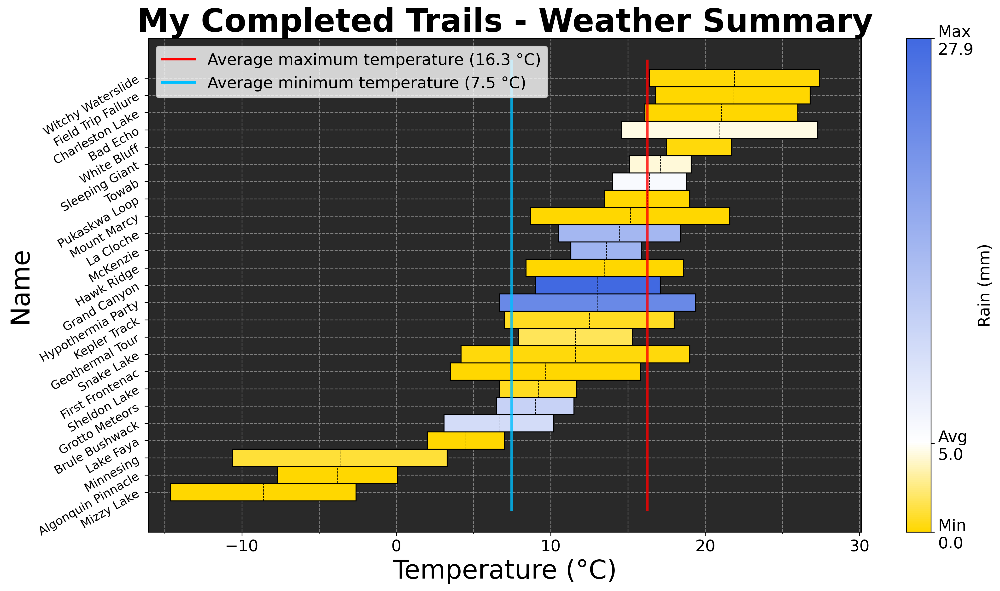

In [21]:
"""
Produces an decendeing coloured bar chart sorted by sortBy.
Bar height is determined by barTop.
barBottom determines the height of the bar bottom.
Bar colour is determined by another inputed feature (colorCol).
"""
def colorBarPlot(plotTitle, 
                 xLabel, 
                 trails,
                 barUnits,
                 barTop,
                 barTopLabel,
                 colorRange,
                 barBottom = 0,
                 barBottomLabel = "",
                 barUnitSpace = True,
                 colorCol = None, # defaults to barTop in function
                 colorLabel = "",
                 yTicks = 'name',
                 yTickLabel = 'name', 
                 xBounds = None, 
                 legendLocation = 'upper right',
                 sortBy = None, # defaults to barTop in function
                 barThickness = 0.3,
                 savePlot = False):
    
    if colorCol == None:
        colorCol = barTop
    
    if sortBy == None:
        sortBy = barTop
        
    BUS = setUnitSpace(barUnitSpace)

    avgTop = trails[barTop].mean()  
    numBarTrails = len(trails)
    
    fig = plt.gcf()
    ax = plt.gca()

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(f"{yTickLabel.capitalize()}", size=axisLabelSize)
    trails = trails.sort_values(by=[sortBy], ascending=True)
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(trails[yTicks]))))
    ax.set_yticklabels(trails[yTickLabel], rotation=30, ha="right")
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(trails)*barThickness)
    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    ax.tick_params(axis='y', which='major', labelsize=12)
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)

    # setting up bar colors
    cRangeMin = trails[colorCol].min()
    cRangeMax = trails[colorCol].max()
    cAvg = trails[colorCol].mean()
    colorList = [(0.0, colorRange[0]), 
                 ((cAvg-cRangeMin)/(cRangeMax-cRangeMin), colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list("", colorList)
    
    # bar bottom logic
    bottomIsInt = isinstance(barBottom, int)
    if bottomIsInt:
        barBottoms = [barBottom]*numBarTrails
        plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
        plt.grid(axis='y', which='both', ls='none')
        topAvgColor = 'mediumpurple'
    else:
        barBottoms = trails[barBottom]
        plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
        avgBottom = trails[barBottom].mean()  
        barBtmLabel=f'Average {barBottomLabel} ({round(avgBottom, 1)}{BUS + barUnits})' 
        topAvgColor='red'
        
    averagesLS = '-'
    averagesLW = 2.5
    bottomAvgColor = 'deepskyblue'
    barTopLabel = f'Average {barTopLabel} ({round(avgTop, 1)}{BUS + barUnits})'
    ax.plot([avgTop, avgTop], [-1, numBarTrails], topAvgColor, lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
    legend_elements = []
    legend_elements.append(Line2D([0], [0], color=topAvgColor, ls=averagesLS, lw=averagesLW, label=barTopLabel))
    if not bottomIsInt:
        ax.plot([avgBottom, avgBottom], [-1, numBarTrails], c=bottomAvgColor, 
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
        legend_elements.append(Line2D([0], [0], color=bottomAvgColor, ls=averagesLS, 
                                      lw=averagesLW, label=barBtmLabel))

    barTops = trails[barTop] - barBottoms
    if xBounds == None:
        plt.xlim(np.min(barBottoms)*1.1, np.max(trails[barTop])*1.1)
    else:
        plt.xlim(xBounds[0], xBounds[1])
        
    # setting colorbar
    sm = ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, handles=legend_elements, loc=legendLocation)
    plt.barh(trails[yTicks], 
            barTops,
            left=barBottoms,
            color=cmap(((trails[colorCol]-cRangeMin)/(cRangeMax-cRangeMin)).astype('float')), 
            height=1, 
            edgecolor='k',
            zorder=2)
    
    if sortBy != barTop:
        # adding secondary lines at bar midpoints
        stepY = (np.array(range(numBarTrails))-0.5).tolist()
        stepY.append(stepY[-1] + 1)
        stepX = ((trails[barTop]+barBottoms)/2).tolist()
        stepX.append(stepX[-1])
        ax.step(stepX, stepY, c='k', where='pre', ls='--', lw=0.6, zorder=3)
    
    fig.patch.set_facecolor('w')
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()
    
# My Completed Trails - Weather Summary
colorBarPlot(plotTitle = "My Completed Trails - Weather Summary",
             xLabel = "Temperature (°C)",
             trails = myCompletedTrails,
             barUnits = "°C",
             barTop = "max_temp",
             barTopLabel = "maximum temperature",
             barBottom = "min_temp",
             barBottomLabel = "minimum temperature",
             colorRange = rainColors,
             colorCol = "rain",
             colorLabel = "Rain (mm)",
             legendLocation = "upper left",
             sortBy = "avg_temp",
             yTickLabel = "name",
             barThickness = 0.3,
             savePlot = True)

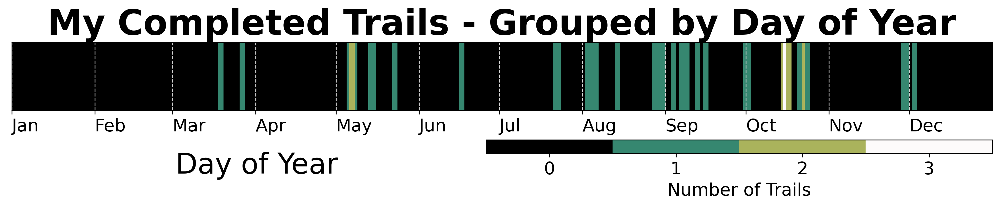

In [22]:
### My Completed Trails - Grouped by Day of Year 

# counts must be a 1D array of length 366
def addTrailToCounts(trail, counts):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        if calendar.isleap(trailDate.year)==False and trailDate.month>2:
            counts[trailDate.timetuple().tm_yday] += 1
        else:
            counts[trailDate.timetuple().tm_yday-1] += 1

trailCounts = np.zeros(366)
myCompletedTrails.apply(lambda trail: addTrailToCounts(trail, trailCounts), axis=1)
            
leapYear = dt.datetime(2020, 1, 1) # arbitrary leap year
periods = [leapYear + dt.timedelta(days=i) for i in range(366)]
cmap = plt.get_cmap('gist_earth', trailCounts.max() + 1)
        
fig = plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight/7))
fig.set_dpi(DPI)
ax = plt.gca()   
ax.bar(periods, 1, align='edge', width=1, linewidth=0, color=cmap(trailCounts/trailCounts.max()), zorder=0)
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.set_xlim(periods[0], periods[-1] + timedelta(hours=23))
for label in ax.xaxis.get_ticklabels():
    label.set_horizontalalignment('left')
ax.xaxis.set_tick_params(labelsize=tickLabelSize)
plt.grid(axis="x", which="both", ls='--', c='lightgrey', zorder=1)

title = "My Completed Trails - Grouped by Day of Year"
ax.set_title(title, size=titleSize, fontweight='bold')
ax.set_xlabel("Day of Year", size=axisLabelSize, position=(0.25,0), labelpad=15)
plt.yticks([])
plt.ylim(0, 1)

# setting colorbar
sm = ScalarMappable(cmap=cmap, norm=plt.Normalize(0,max(trailCounts)))
n_clusters = max(trailCounts) + 1
tick_locs = (np.arange(n_clusters) + 0.5)*(n_clusters-1)/n_clusters
cbar = plt.colorbar(sm, orientation='horizontal', cax=fig.add_axes([0.5,-0.35,0.4,0.15]))
cbar.set_label('Number of Trails', size=tickLabelSize)
cbar.set_ticks(tick_locs)
cbar.ax.tick_params(labelsize=tickLabelSize)
cbar.set_ticklabels(range(int(n_clusters)))

fig.patch.set_facecolor('w')
plt.savefig(f'images/{title.replace(" ", "")}', bbox_inches='tight')
plt.show()

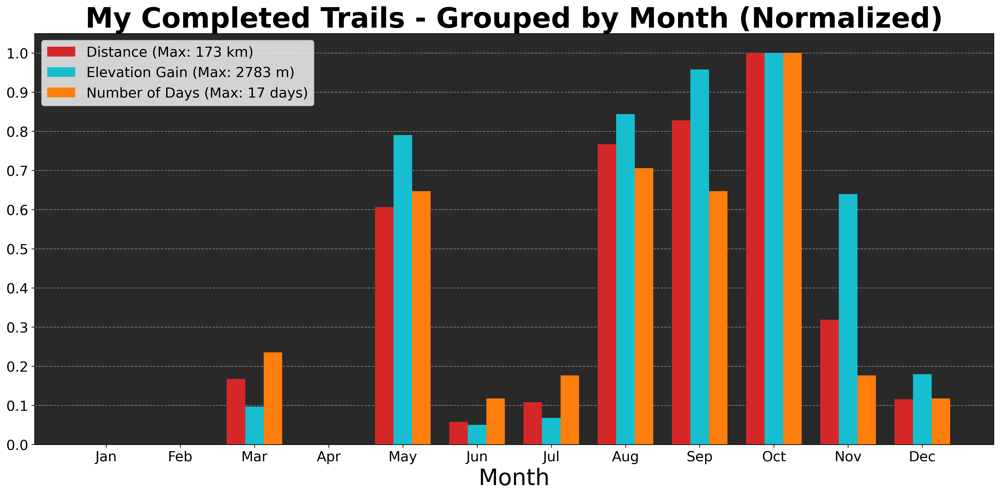

In [23]:
### My Completed Trails - Grouped by Month (Normalized)

def addTrailToMonth(trail, feature, barValues):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        barValues[trailDate.month-1] += trail[feature]/trail.days

def summaryByMonthPlot(plotTitle, trails, legendLabels, units, features, colors):
    
    fig = plt.gcf()
    ax = plt.gca()
    periods = np.arange(12)
    barsPerMonth = len(features)
    barWidth = 1/(1 + barsPerMonth)

    for featureIndex, feature in enumerate(features):
        barValues = np.zeros(12)
        myCompletedTrails.apply(lambda trail: addTrailToMonth(trail, feature, barValues), axis=1)
                
        #setting bar position
        if featureIndex == 0:
            position = -(barsPerMonth-1)*barWidth/2
        else:
            position += barWidth
            
        ax.bar(periods+position, 
               barValues/barValues.max(), 
               width=barWidth, 
               linewidth=0, 
               color=colors[featureIndex],
               label=f"{legendLabels[featureIndex]} (Max: {round(barValues.max())} {units[featureIndex]})",
               zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    fig.set_dpi(DPI)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    plt.grid(axis="y", which="both", ls='--', c='grey', zorder=0)
    plt.grid(axis="x", which="both", ls='none')
    plt.xticks(periods, months)
    plt.locator_params(axis='y', nbins=11)

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    ax.set_xlabel("Month", size=axisLabelSize)
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    plt.tight_layout()
    plt.savefig(f'images/{plotTitle.replace(" ", "")}')
    plt.show()

summaryByMonthPlot(plotTitle = "My Completed Trails - Grouped by Month (Normalized)", 
                   trails = myCompletedTrails,
                   features = ['distance', 'elevation_gain', 'days'],
                   colors = ['tab:red', 'tab:cyan', 'tab:orange'],
                   legendLabels = ['Distance', 'Elevation Gain', 'Number of Days'],
                   units = ['km', 'm', 'days'])

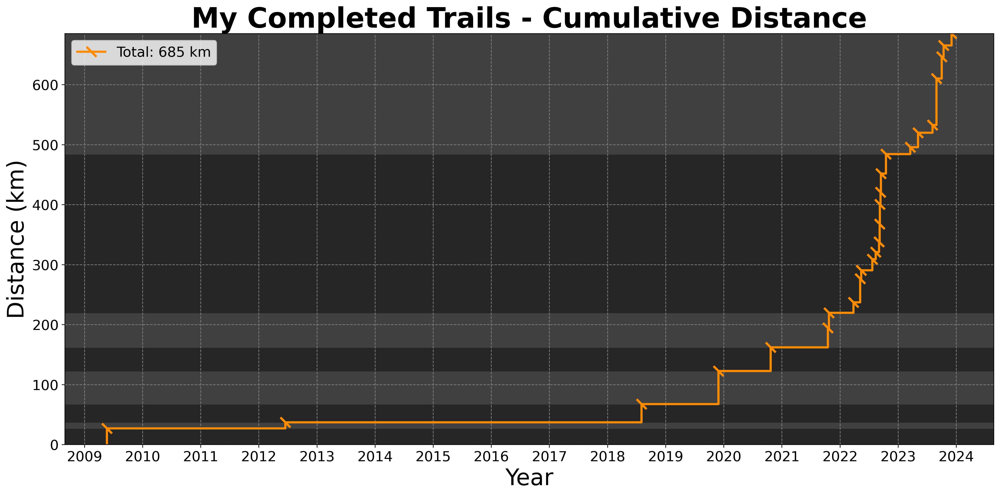

In [24]:
### My Completed Trails - Cumulative Distance
    
# adding an extra datapoint for step plot appearance
distCum = pd.concat([pd.Series(0), myCompletedTrails.distance.cumsum()])
xDates = pd.concat([pd.Series(myCompletedTrails.end_date[0]), myCompletedTrails.end_date])

# plotting
ax = plt.gca()
fig = plt.gcf()
title = "My Completed Trails - Cumulative Distance"
ax.set_title(title, size=titleSize, fontweight="bold")
plt.step(xDates, distCum, where="post", linewidth=2.5, markevery=(1, 1), marker=(2, 2, 45), markersize="16",
         mew=2.5, color=distColor, label=f"Total: {round(myCompletedTrails.distance.sum())} km", zorder=2)

# adding alternating colours on distance-axis for each calendar year
years = xDates.dt.year.array
distinctYears = []
calendarYearBarRollingValue = 0
for i, dist in enumerate(distCum.array): 
    if len(distinctYears)%2 == 0:
        color = '0.25'
    else:
        color = '0.15'
    
    if i == len(years)-1:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
    elif years[i+1] not in distinctYears:
        distinctYears.append(years[i+1])
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=color, edgecolor=color, zorder=0)
        calendarYearBarRollingValue = dist
        
plt.ylim(0, distCum.max())
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.grid(axis="both", which="both", ls='--', c='grey', zorder=1)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
fig.set_dpi(DPI)
plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, loc=2)
plt.locator_params(axis='y', nbins=11)
plt.xlabel("Year", size=axisLabelSize)
plt.ylabel("Distance (km)", size=axisLabelSize)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

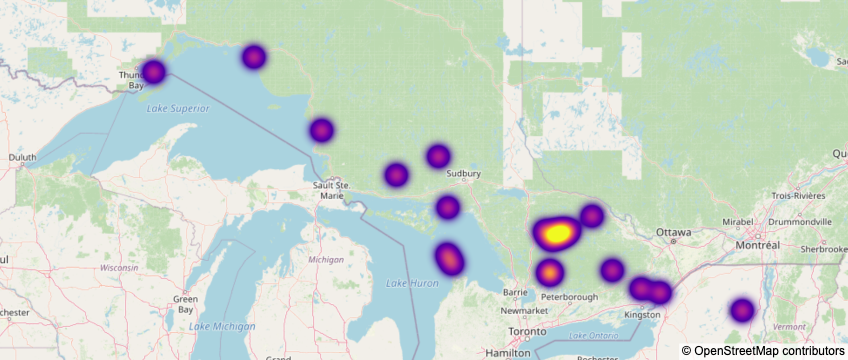

In [26]:
### Trail Locations on Map

fig = px.density_mapbox(myCompletedTrails, lat='lat', lon='lng', radius=20, center=dict(lat=46.5, lon=278), 
                        zoom=4.8, mapbox_style="open-street-map")

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update(layout_coloraxis_showscale=False)
fig.show()

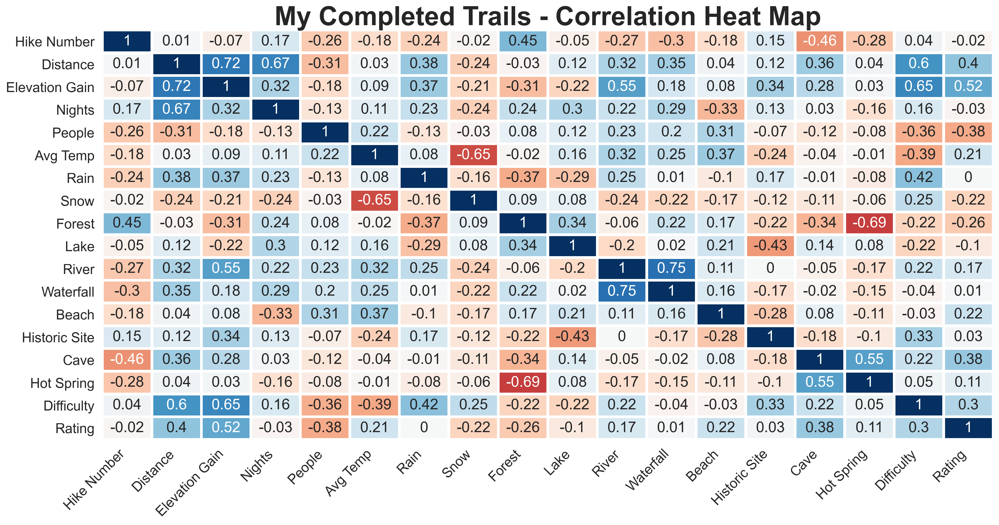

In [40]:
### My Completed Trails - Correlation Heat Map

# generates correlation heat map for the given columns
def corrHeatMap(titleStart, 
                trails, 
                columns, 
                labels):
    
    trails = trails[columns]
    corr = trails.corr().round(2)
    sns.set(rc={"figure.figsize":(standardCanvasWidth, standardCanvasHeight)})
    sns.set(font_scale = 1.5)
    heatmap = sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center= 0, cmap="RdBu", linewidths=3, 
                          yticklabels=labels, cbar=False)
    
    fig = plt.gcf()
    ax = plt.gca()
    
    fig.set_dpi(DPI)
    ax.set_xticklabels(labels, rotation = 45, ha="right")
    title = f"{titleStart} - Correlation Heat Map"
    ax.set_title(title, size=titleSize, fontweight="bold")
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    plt.show()

myHeatMapColumns = ['id','distance','elevation_gain','nights','people','avg_temp','rain','snow','forest',
                    'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

myHeatMapLabels = ['Hike Number','Distance','Elevation Gain','Nights','People','Avg Temp','Rain','Snow','Forest',
                   'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('My Completed Trails', 
            myCompletedTrails, 
            myHeatMapColumns, 
            myHeatMapLabels)

In [33]:
### Deprecated

# ### Full Dataset - Correlation Heat Map

# ourHeatMapColumns = ['distance','elevation_gain','num_reviews','summer_temp','winter_temp','annual_rain','annual_snow',
#                      'forest','lake','river','waterfall','beach','historic_site','cave','hot_spring',
#                      'backpacking','Jamie','difficulty','rating']

# ourHeatMapLabels = ['Distance','Elevation Gain','# of Reviews','Summer Temp','Winter Temp','Annual Rain', 'Annual Snow',
#                     'Forest','Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Backpacking',
#                     'Jamie Trail','Difficulty','Rating']

# corrHeatMap('Full Dataset', ourTrails, ourHeatMapColumns, ourHeatMapLabels)

<b><font size="3">Generating Difficulty Model</font></b>

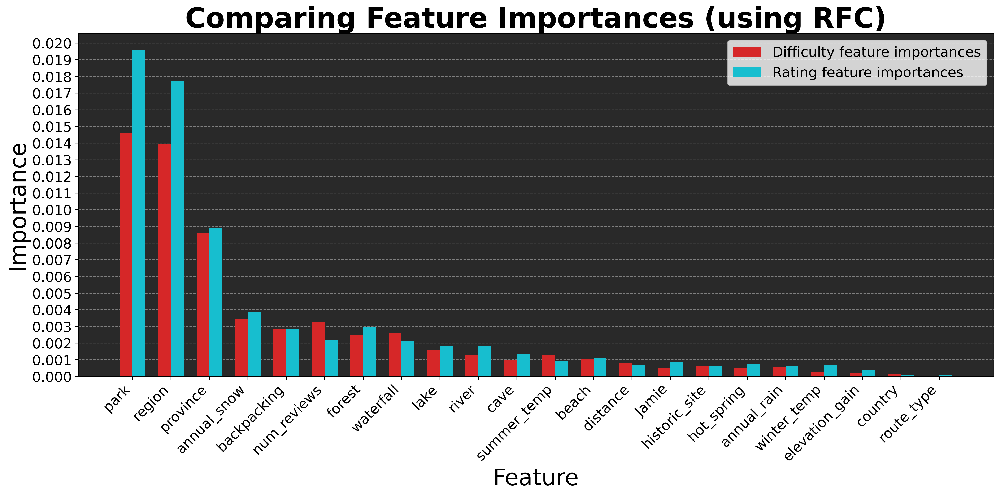

In [16]:
### Comparing Feature Importances (using RFC)

ourTrailsForImportance = ourTrails.query('rating != 1.5')  # there are only two 1.5s, not enough for split

# getting difficulty importances
y_difficulty = ourTrailsForImportance.loc[:, 'difficulty']
ourTrailsForTraining = ourTrailsForImportance[X_columns]
ourTrailsForTraining = transformer.fit_transform(ourTrailsForTraining)

X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(ourTrailsForTraining, y_difficulty, test_size=0.2)

difficultyModel = RandomForestClassifier() # must use a tree algorithm to get importance
difficultyModel.fit(X_train_d, y_train_d)
difficultyImportanceData = list(zip(X_columns, difficultyModel.feature_importances_))
featureImportances = pd.DataFrame(difficultyImportanceData, columns =['feature', 'difficulty_importance'])

# getting rating importances
y_rating = ourTrailsForImportance.loc[:, 'rating']
y_rating = [str(r) for r in y_rating]

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(ourTrailsForTraining, y_rating, test_size=0.2)

ratingModel = RandomForestClassifier()
ratingModel.fit(X_train_r, y_train_r)
ratingImportanceData = list(zip(X_columns, ratingModel.feature_importances_))
featureImportances['rating_importance'] = pd.DataFrame(ratingImportanceData, 
                                                       columns =['feature', 'rating_importance']).rating_importance

# sorting by average importance
featureImportances['avg_importance'] = (featureImportances.difficulty_importance 
                                        + featureImportances.rating_importance)/2
featureImportances = featureImportances.sort_values(by=['avg_importance'], ascending=False)

fig = plt.gcf()
ax = plt.gca()

# plotting
featurePositions = np.arange(len(featureImportances.feature))
ax.bar(featurePositions - 1/6, featureImportances.difficulty_importance, width=1/3, lw=0, color='tab:red',
       label='Difficulty feature importances', zorder=2)
ax.bar(featurePositions + 1/6, featureImportances.rating_importance, width=1/3, lw=0, color='tab:cyan',
       label='Rating feature importances', zorder=2)

fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
fig.set_dpi(DPI)
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
plt.grid(axis="y", which="both", ls='--', c='grey', zorder=0)
plt.grid(axis="x", which="both", ls='none')
plt.xticks(featurePositions, featureImportances.feature)
plt.locator_params(axis='y', nbins=featureImportances.feature.count())
ax.xaxis.set_major_locator(mticker.FixedLocator(featurePositions))
ax.set_xticklabels(featureImportances['feature'], rotation=45, ha="right")
ax.set_title("Comparing Feature Importances (using RFC)", size=titleSize, fontweight='bold')
ax.set_xlabel("Feature", size=axisLabelSize)
ax.set_ylabel("Importance", size=axisLabelSize)
fig.patch.set_facecolor('w')
plt.rcParams['axes.facecolor'] = backgroundColor
plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
plt.tight_layout()
plt.show()

In [77]:
### Finding Best Difficulty Estimator

# returns the score for a given model
def testEstimator(model, modelStr, XTrain, yTrain, XTest, yTest):
    model.fit(XTrain, yTrain)
    print(f'{modelStr}: {round(model.score(XTest, yTest), 3)}')

# setting up data for training
y_difficulty = ourTrails.loc[:, 'difficulty']
ourTrailsForTraining = ourTrails[X_columns]
ourTrailsForTraining = transformer.fit_transform(ourTrailsForTraining)

X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(ourTrailsForTraining, 
                                                            y_difficulty, 
                                                            test_size=0.2, 
                                                            random_state=12)

print('DIFFICULTY MODEL SCORES:') # Can treat difficulty as numeric or catagorical
testEstimator(Ridge(), 'Ridge', X_train_d, y_train_d, X_test_d, y_test_d)
testEstimator(SVR(), 'SVR', X_train_d, y_train_d, X_test_d, y_test_d)
testEstimator(Lasso(), 'Lasso', X_train_d, y_train_d, X_test_d, y_test_d)
testEstimator(SVC(), 'SVC', X_train_d, y_train_d, X_test_d, y_test_d)
testEstimator(RandomForestClassifier(), 'Random Forest Classifier', X_train_d, y_train_d, X_test_d, y_test_d)

DIFFICULTY MODEL SCORES:
Ridge: 0.339
SVR: 0.529
Lasso: 0.342
SVC: 0.655
Random Forest Classifier: 0.677


In [74]:
### Creating Difficulty Model (RFC)

cvGridRFC = {"n_estimators": [100, 250, 500],
             "max_depth": [5, 10, 20],
             "min_samples_split": [2, 4, 8],
             "min_samples_leaf": [1, 2, 4]}

difficultyModel = GridSearchCV(RandomForestClassifier(), cvGridRFC, refit=True, verbose=0)
difficultyModel.fit(X_train_d, y_train_d)
difficultyScore = round(difficultyModel.score(X_test_d, y_test_d), 3)

print(f'Difficulty Model Score: {difficultyScore}')

Difficulty Model Score: 0.685


In [75]:
# saving best difficulty model
difficultyModelFileName = f'models/trailGenie_difficulty_{difficultyScore}.sav'
pickle.dump(difficultyModel, open(difficultyModelFileName, 'wb'))

<b><font size="3">Generating Rating Model</font></b>

In [94]:
### Finding Best Rating Estimator

# setting up data for training
y_rating = ourTrails.loc[:, 'rating']
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(ourTrailsForTraining, y_rating, 
                                                            test_size=0.2, random_state=6)

print('RATING MODEL SCORES:')
testEstimator(Ridge(), 'Ridge', X_train_r, y_train_r, X_test_r, y_test_r)
testEstimator(SVR(), 'SVR', X_train_r, y_train_r, X_test_r, y_test_r)
testEstimator(Lasso(), 'Lasso', X_train_r, y_train_r, X_test_r, y_test_r)

RATING MODEL SCORES:
Ridge: 0.143
SVR: 0.133
Lasso: 0.116


In [95]:
### Creating Rating Model

ratingModel = RidgeCV()
ratingModel.fit(X_train_r, y_train_r)
ratingScore = round(ratingModel.score(X_test_r, y_test_r), 3)

print(f'Rating Model Score: {ratingScore}')

Rating Model Score: 0.208


In [96]:
# saving best rating model
ratingModelFileName = f'models/trailGenie_rating_{ratingScore}.sav'
pickle.dump(ratingModel, open(ratingModelFileName, 'wb'))

<b><font size="3">Making Predictions</font></b>

In [27]:
### Making Difficulty Predictions

# loading difficulty model
difficultyModel = pickle.load(open('models/trailGenie_difficulty_0.685.sav', 'rb'))

# setting up data for predictions
myWatchedTrailsForPrediction = myWatchedTrails[X_columns]
myWatchedTrailsForPrediction = transformer.fit_transform(myWatchedTrailsForPrediction)

difficultyModelWeightedScores = []
for pp in difficultyModel.predict_proba(myWatchedTrailsForPrediction):
    # getting the weighted average of the difficulty predictions
    difficultyModelWeightedScores.append(round((pp[0])+(3*pp[1])+(5*pp[2])+(7*pp[3]), 2)) 

# adding weighted averages to myWatchedTrails
myWatchedTrails.difficulty = difficultyModelWeightedScores

In [28]:
### Making Rating Predictions

# loading difficulty model
ratingModel = pickle.load(open('models/trailGenie_rating_0.208.sav', 'rb'))
# ratingModel = pickle.load(open(ratingModelFileName, 'rb'))    

# adding prediction results to myWatchedTrails
myWatchedTrails.rating = np.round(ratingModel.predict(myWatchedTrailsForPrediction), 2)

In [29]:
### Saving Prediction Results

myWatchedTrails['park'] = myWatchedTrails['park_init'] # setting the park names back to initial values before saving
myWatchedTrails['region'] = myWatchedTrails['region_init']
myWatchedTrails['province'] = myWatchedTrails['province_init']
myWatchedTrails['country'] = myWatchedTrails['country_init']
myTrails = pd.concat([myCompletedTrails, myWatchedTrails])[['name', 'id', 'status', 'park', 'region', 'province',
    'country', 'distance', 'elevation_gain', 'start_date', 'end_date', 'nights', 'people', 'people_names', 
    'max_temp', 'min_temp', 'rain', 'snow', 'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow', 'route_type', 
    'lat', 'lng', 'forest', 'lake', 'river','waterfall', 'beach', 'historic_site', 'cave', 'hot_spring', 'difficulty', 
    'rating', 'route']]

# saving
myTrails.to_csv(myTrailsCSV, index=False)

convertNewRegionsInMyTrails() # back to the way it was before

<b><font size="3">Plotting Difficulty and Rating Prediction Results</font></b>

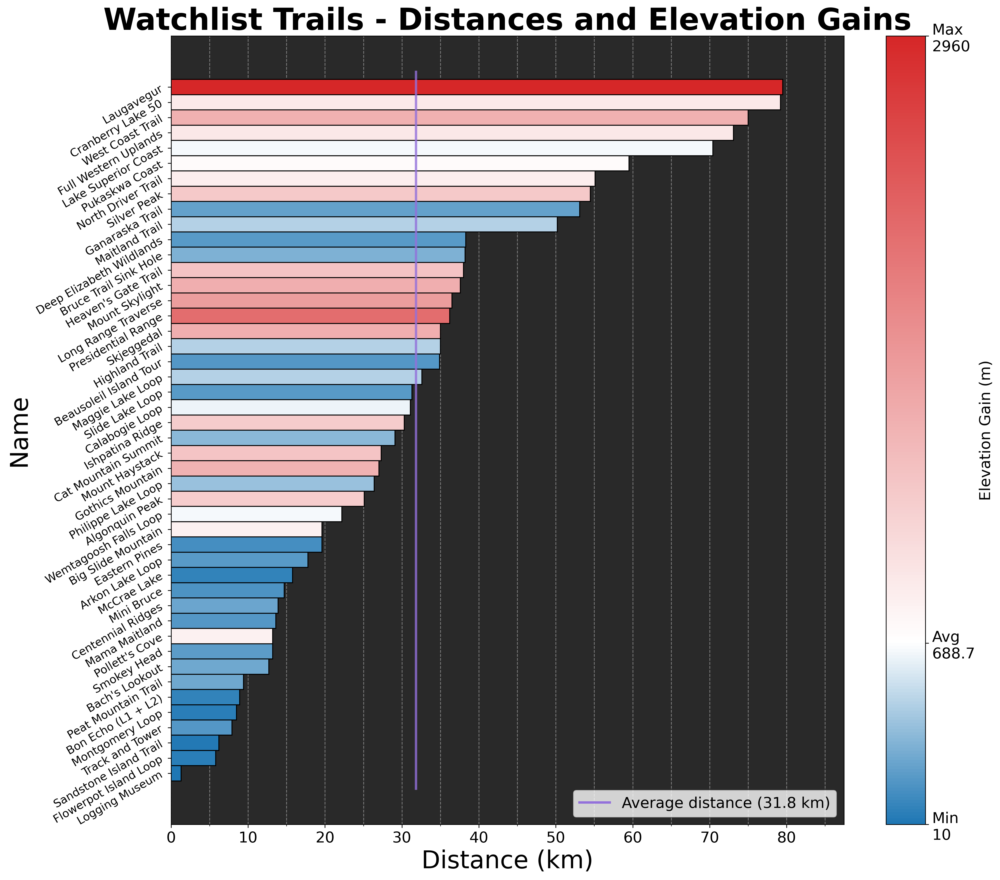

In [30]:
### Watchlist Trails - Distances

### My CompletWatched Trails - Temperatures

colorBarPlot(plotTitle = "Watchlist Trails - Distances and Elevation Gains",
             xLabel = "Distance (km)",
             trails = myWatchedTrails,
             barUnits = "km",
             barTop = "distance",
             barTopLabel = "distance",
             colorRange = gainColors,
             colorCol = "elevation_gain",
             legendLocation = "lower right",
             colorLabel = "Elevation Gain (m)",
             savePlot = True)

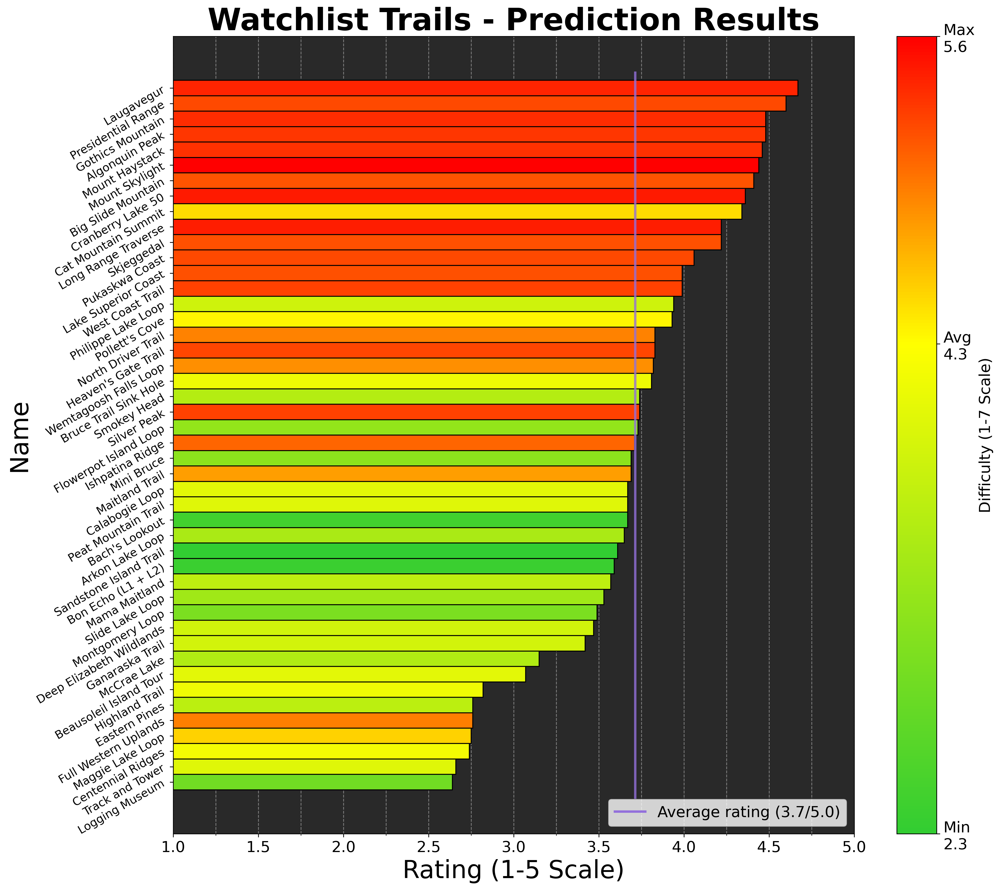

In [31]:
### Watchlist Trails - Weighted Average of Difficulty Predictions

colorBarPlot(plotTitle = "Watchlist Trails - Prediction Results",
             xLabel = "Rating (1-5 Scale)",
             trails = myWatchedTrails,
             barUnits = "/5.0",
             barUnitSpace = False,
             barTop = "rating",
             barTopLabel = "rating",
             colorRange = [diffColors[0], diffColors[1], diffColors[3]],
             colorCol = "difficulty",
             colorLabel = "Difficulty (1-7 Scale)",
             legendLocation = "lower right",
             xBounds = [1,5],
             savePlot = True)